# Zillow EDA
---

## Load Prprocessed Data
---

In [2]:
import sqlite3 as sql

zillow_preprocessed_data_db = '../data/Zillow/zillow.db'

zillow_conn = sql.connect(zillow_preprocessed_data_db)

In [3]:
import logging

# Create a logger
logger = logging.getLogger('zillow_eda')
logger.setLevel(logging.DEBUG)

# Create file handler which logs even debug messages
fh = logging.FileHandler('eda.log')
fh.setLevel(logging.DEBUG)

# Create console handler with a higher log level
ch = logging.StreamHandler()
ch.setLevel(logging.ERROR)

# Create formatter and add it to the handlers
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
fh.setFormatter(formatter)
ch.setFormatter(formatter)

# Add the handlers to the logger
logger.addHandler(fh)
logger.addHandler(ch)

logger.info('Logger for Zillow EDA initialized')


# California Data
---

In [4]:
import pandas as pd
zillow_ca_rental_df = pd.read_sql_query("SELECT * FROM rent WHERE StateName = 'CA'", zillow_conn, index_col=None)
logger.info('California Rental Data loaded')

In [5]:
import pygwalker as pyg

## Rental Data for SD,LA, and SF
---

In [6]:
zillow_ca_rental_df.head()

,index,RegionName,RegionType,StateName,RegionID,SizeRank,date,rent,Season,Political Leaning
0,2,"Los Angeles, CA",msa,CA,753899,2,2015-01-31 00:00:00,1837.427194,Winter,Blue
1,12,"San Francisco, CA",msa,CA,395057,12,2015-01-31 00:00:00,2338.152519,Winter,Blue
2,13,"Riverside, CA",msa,CA,395025,13,2015-01-31 00:00:00,1367.691057,Winter,Blue
3,17,"San Diego, CA",msa,CA,395056,17,2015-01-31 00:00:00,1705.263590,Winter,Blue
4,26,"Sacramento, CA",msa,CA,395045,26,2015-01-31 00:00:00,1264.655392,Winter,Blue


In [7]:
vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"RegionType","name":"RegionType","basename":"RegionType","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"StateName","name":"StateName","basename":"StateName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Political Leaning","name":"Political Leaning","basename":"Political Leaning","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"index","name":"index","basename":"index","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"RegionID","name":"RegionID","basename":"RegionID","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"SizeRank","name":"SizeRank","basename":"SizeRank","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"median","offset":0}],"columns":[{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0}],"color":[{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["Los Angeles, CA"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"full","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_dYXm","name":"Los Angeles Rental Fluctuations"},{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"RegionType","name":"RegionType","basename":"RegionType","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"StateName","name":"StateName","basename":"StateName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Political Leaning","name":"Political Leaning","basename":"Political Leaning","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"index","name":"index","basename":"index","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"RegionID","name":"RegionID","basename":"RegionID","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"SizeRank","name":"SizeRank","basename":"SizeRank","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"median","offset":0}],"columns":[{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0}],"color":[{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["San Diego, CA"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"full","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_qeTO","name":"San Diego Rental Fluctuations "},{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1,"timezoneDisplayOffset":0},"encodings":{"dimensions":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"RegionType","name":"RegionType","basename":"RegionType","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"StateName","name":"StateName","basename":"StateName","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"Political Leaning","name":"Political Leaning","basename":"Political Leaning","semanticType":"nominal","analyticType":"dimension","offset":0},{"fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"fid":"index","name":"index","basename":"index","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"RegionID","name":"RegionID","basename":"RegionID","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"SizeRank","name":"SizeRank","basename":"SizeRank","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0},{"fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"fid":"rent","name":"rent (USD)","basename":"rent","analyticType":"measure","semanticType":"quantitative","aggName":"sum","offset":0}],"columns":[{"fid":"date","name":"date","basename":"date","semanticType":"nominal","analyticType":"dimension","offset":0}],"color":[{"fid":"Season","name":"Season","basename":"Season","semanticType":"nominal","analyticType":"dimension","offset":0}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"fid":"RegionName","name":"RegionName","basename":"RegionName","semanticType":"nominal","analyticType":"dimension","offset":0,"rule":{"type":"one of","value":["San Francisco, CA"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"full","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_TCPL","name":"San Francisco Rental Fluctuations"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"filter","filters":[{"fid":"RegionName","rule":{"type":"one of","value":["Los Angeles, CA"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["date","Season"],"measures":[{"field":"rent","agg":"median","asFieldKey":"rent_median"}]}]}]},{"workflow":[{"type":"filter","filters":[{"fid":"RegionName","rule":{"type":"one of","value":["San Diego, CA"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["date","Season"],"measures":[{"field":"rent","agg":"median","asFieldKey":"rent_median"}]}]}]},{"workflow":[{"type":"filter","filters":[{"fid":"RegionName","rule":{"type":"one of","value":["San Francisco, CA"]}}]},{"type":"view","query":[{"op":"aggregate","groupBy":["date","Season"],"measures":[{"field":"rent","agg":"sum","asFieldKey":"rent_sum"}]}]}]}],"version":"0.4.8.5"}"""
pyg.walk(zillow_ca_rental_df, spec=vis_spec)
logger.info('California Rental Data visualized')

Box(children=(HTML(value='<div id="ifr-pyg-00061d158af05b0byahpk36BTDtJNviw" style="height: auto">\n    <head>…

In [8]:
import pandas as pd
import seaborn as sns  # This is used in the function
import matplotlib.pyplot as plt  # This is used in the function

def plot_correlation_heatmap(df, figsize=(10, 10), cmap='coolwarm', title='Correlation Heatmap'):
    # Encode categorical data
    df_encoded = pd.get_dummies(df)


    correlation_matrix = df_encoded.corr()
    
    plt.figure(figsize=figsize)

    sns.heatmap(correlation_matrix, cmap=cmap, center=0,  fmt=".2f")  # Added annot and fmt

    plt.title(title)
    plt.show()

## California Rental Training Set 1
---

In [9]:
zillow_ca_rental_training_data_1 = zillow_ca_rental_df
zillow_ca_rental_training_data_1.head()
zillow_ca_rental_training_data_1.info()
zillow_ca_rental_training_data_1.describe()
zillow_ca_rental_training_data_1.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3696 entries, 0 to 3695
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              3696 non-null   int64  
 1   RegionName         3696 non-null   object 
 2   RegionType         3696 non-null   object 
 3   StateName          3696 non-null   object 
 4   RegionID           3696 non-null   int64  
 5   SizeRank           3696 non-null   int64  
 6   date               3696 non-null   object 
 7   rent               3696 non-null   float64
 8   Season             3696 non-null   object 
 9   Political Leaning  3696 non-null   object 
dtypes: float64(1), int64(3), object(6)
memory usage: 288.9+ KB


Index(['index', 'RegionName', 'RegionType', 'StateName', 'RegionID',
       'SizeRank', 'date', 'rent', 'Season', 'Political Leaning'],
      dtype='object')

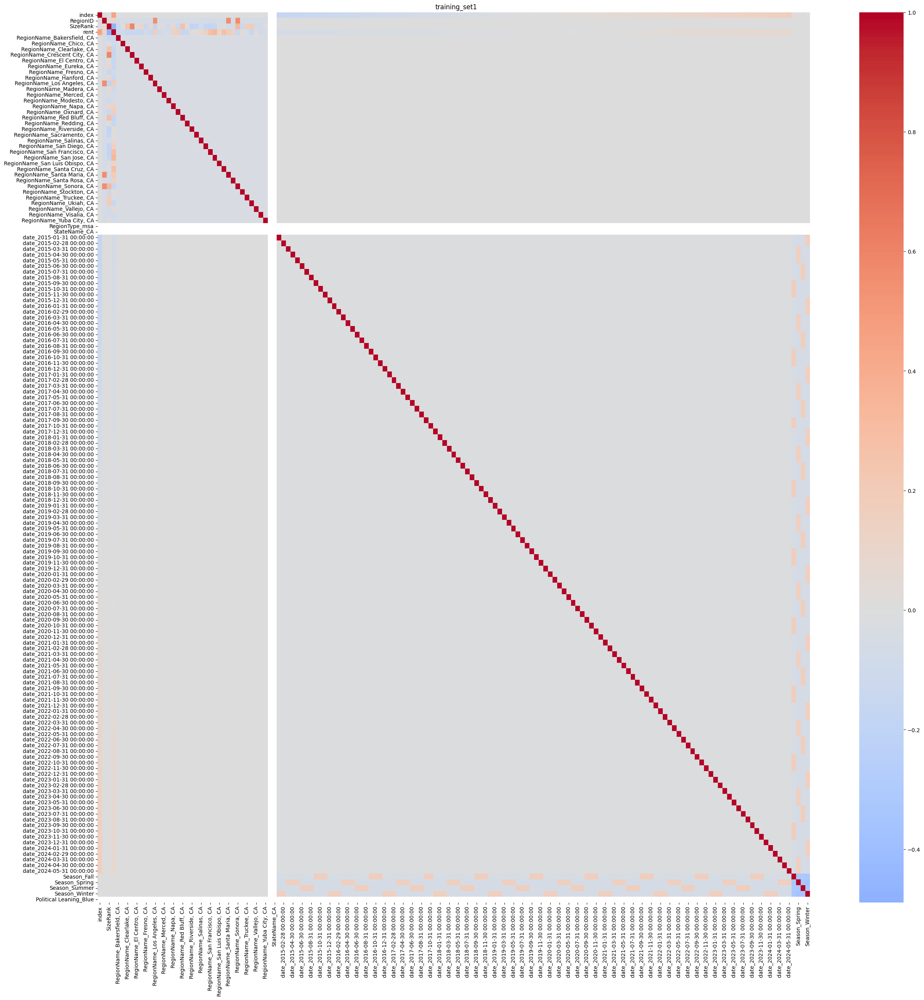

In [10]:
plot_correlation_heatmap(zillow_ca_rental_training_data_1,figsize=(30,30),title="training_set1")


In [11]:
zillow_ca_rental_df.columns

Index(['index', 'RegionName', 'RegionType', 'StateName', 'RegionID',
       'SizeRank', 'date', 'rent', 'Season', 'Political Leaning'],
      dtype='object')

- Dates have no correlation to rent so we can omit that from training data.
- The regions with the strongest correlation to rent are 'RegionName' and 'RegionID'.
- The regions with the weakest correlation to rent are 'index' and 'SizeRank'.

## Prepare Training Data
---

In [13]:
training_features_1 = ['RegionName','RegionID','rent','SizeRank'] #first training set will have all correlated features to rent regrdless of strength.
ca_rent_training_set_1 = zillow_ca_rental_df[training_features_1]

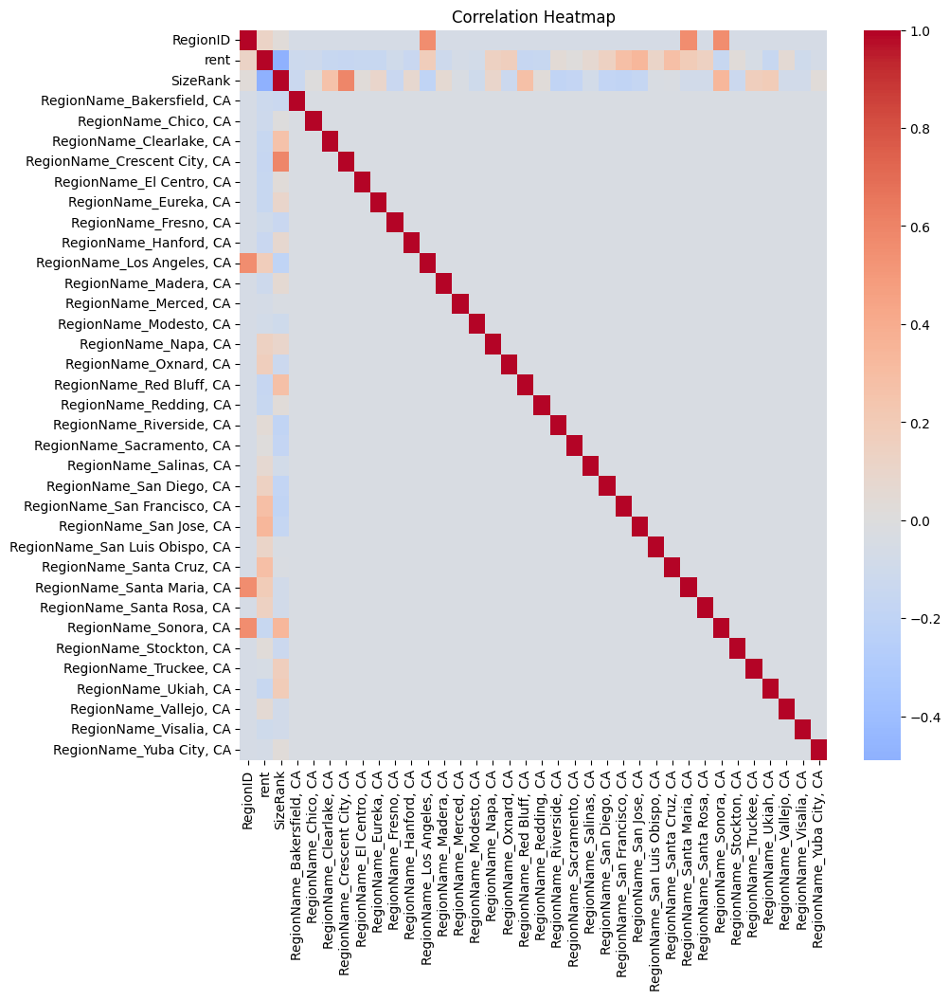

In [15]:
plot_correlation_heatmap(ca_rent_training_set_1)

In [18]:
#lets export this to our training data.
TRAINING_ROOT_DIR='../data/training_data/'
ca_rent_training_set_1.to_feather(f'{TRAINING_ROOT_DIR}ca_rent_training_data_1.ft') #saved as feather files to optimize space efficiency.



In [19]:
#second training set will only have the stronger features.
training_features_2 = ['RegionName', 'RegionID', 'rent'] #smaller but prob better quality.
ca_rent_training_set_2 =  zillow_ca_rental_df[training_features_2]

In [20]:
ca_rent_training_set_2.to_feather(f'{TRAINING_ROOT_DIR}ca_rent_training_data_2.ft')

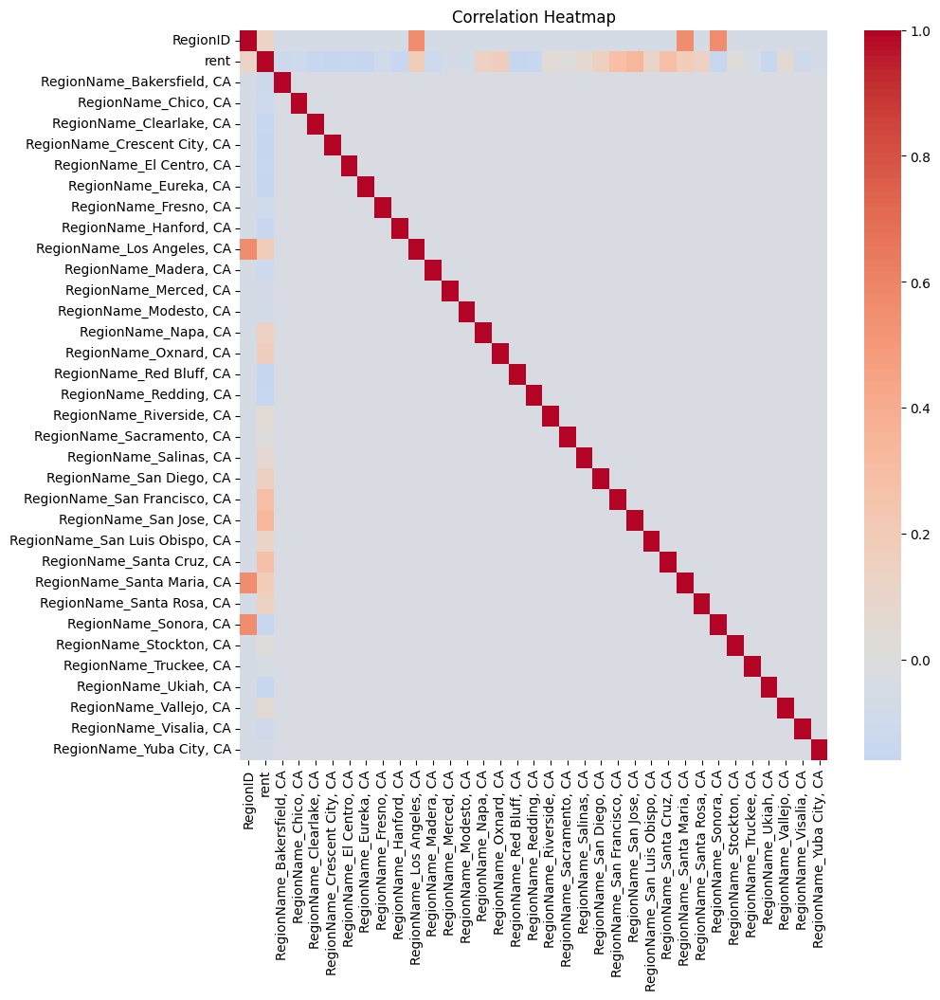

In [21]:
plot_correlation_heatmap(ca_rent_training_set_2)